## Import all library

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import mne
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
import pywt 
from PIL import Image
from utility import *

## Determine suitable constant to divide
* This is done by Visualize the min, max, mean, Q-10%, Q2, Q-90%, std  for each eeg file
* Choose the minimum of Q-10%, OR maximum of Q-90% as the constant to divide the whole eeg file
 

In [2]:
# Create empty dataframe
df_summary_spike    = pd.DataFrame(columns=["EEG file"] + AVE_CHANNELS_NAME)
df_summary_no_spike = pd.DataFrame(columns=["EEG file"] + AVE_CHANNELS_NAME)
df_summary_spike

,EEG file,F7-AVE,T3-AVE,T5-AVE,Fp1-AVE,F3-AVE,C3-AVE,P3-AVE,O1-AVE,Fz-AVE,Cz-AVE,Pz-AVE,O2-AVE,P4-AVE,C4-AVE,F4-AVE,Fp2-AVE,T6-AVE,T4-AVE,F8-AVE


In [3]:
def append_result(num, df_summary, df):
    df_summary.loc[len(df_summary)] = np.concatenate(([str(num) + " (Max)"]  , df.max(axis=0)[0].numpy() ))           # Add in the maximum value for each channel
    df_summary.loc[len(df_summary)] = np.concatenate(([str(num) + " (Min)"]  , df.min(axis=0)[0].numpy() ))           # Add in the minimum value for each channel
    df_summary.loc[len(df_summary)] = np.concatenate(([str(num) + " (Q-90%)"], df.quantile(0.10,axis=0).numpy() )) # Add in the 0.1 quantile value for each channel
    df_summary.loc[len(df_summary)] = np.concatenate(([str(num) + " (Q2)"]   , df.quantile(0.50,axis=0).numpy() )) # Add in the Q2 value for each channel
    df_summary.loc[len(df_summary)] = np.concatenate(([str(num) + " (Q-10%)"], df.quantile(0.90,axis=0).numpy() )) # Add in the 0.9 quantile value for each channel
    df_summary.loc[len(df_summary)] = np.concatenate(([str(num) + " (Mean)"] , df.mean(axis=0).numpy() ))          # Add in the mean value for each channel
    df_summary.loc[len(df_summary)] = np.concatenate(([str(num) + " (Std)"]  , df.std(axis=0).numpy() ))           # Add in the std value for each channel

    return df_summary


def get_list_seperately(df_summary):
    lengths      = len(df_summary)
    num_channels = len(AVE_CHANNELS_NAME)
    max_list, min_list, Q1_list, Q2_list, Q3_list, mean_list, std_list = np.zeros((lengths//7,num_channels)), np.zeros((lengths//7,num_channels)), np.zeros((lengths//7,num_channels)), np.zeros((lengths//7,num_channels)), np.zeros((lengths//7,num_channels)), np.zeros((lengths//7,num_channels)), np.zeros((lengths//7,num_channels))
    
    for i in range(lengths//7):
        max_list[i] = df_summary.iloc[i*7]
        min_list[i] = df_summary.iloc[i*7+1]
        Q1_list[i]  = df_summary.iloc[i*7+2]
        Q2_list[i]  = df_summary.iloc[i*7+3]
        Q3_list[i]  = df_summary.iloc[i*7+4]
        mean_list[i]= df_summary.iloc[i*7+5]
        std_list[i] = df_summary.iloc[i*7+6]
        
    dict1 = {"Max":max_list, "Min":min_list, "Q1":Q1_list, "Q2":Q2_list, "Q3":Q3_list, "mean":mean_list, "std":std_list}
    return dict1

def plot_summary(df_summary, title):
    dict1 = get_list_seperately(df_summary)
    
    for key in dict1:
        fig, ax = plt.subplots(len(AVE_CHANNELS_NAME),1,figsize=(20,40))
        for i, col in enumerate(AVE_CHANNELS_NAME):
            ax[i].plot(dict1[key][:,i], '--.',label=key)
            ax[i].set_title(col)
            ax[i].legend()

        plt.savefig(f"{VIS_FILE_DIRC}/{key}_{title}.png", transparent = False,  facecolor = 'white')

In [4]:
%%time
for num in range(1,21):
    df              = get_df(f'{CSV_FILE_DIRC}/eeg{num}.csv')       # Get the dataframe from the filename
    spike_locations = get_spike_location(num)                       # Get the spike label from the annotation.json
    data, label     = get_data_n_label(df, spike_locations)         # Get the data in epoch, and its corresponding label
    
    if sum(label) == 0: # no spike:
        df_summary_no_spike = append_result(num, df_summary_no_spike, data.reshape(-1, len(AVE_CHANNELS_NAME))) 
    else:
        df_summary_spike    = append_result(num, df_summary_spike   , data[label==1].reshape(-1, len(AVE_CHANNELS_NAME))) 
    

The data from EEG_csv/eeg1.csv is loaded 
There is spike in this eeg file
Data before split : (3840, 19)
Data with   spike: (3840, 19)
Data after  split into window: (3, 1280, 19)
Labels: (3,)
Num spike: 3
The data from EEG_csv/eeg2.csv is loaded 
There is no spike in this eeg file
(160, 1280, 19)
The data from EEG_csv/eeg3.csv is loaded 
There is no spike in this eeg file
(153, 1280, 19)
The data from EEG_csv/eeg4.csv is loaded 
There is no spike in this eeg file
(170, 1280, 19)
The data from EEG_csv/eeg5.csv is loaded 
There is no spike in this eeg file
(148, 1280, 19)
The data from EEG_csv/eeg6.csv is loaded 
There is no spike in this eeg file
(207, 1280, 19)
The data from EEG_csv/eeg7.csv is loaded 
There is no spike in this eeg file
(147, 1280, 19)
The data from EEG_csv/eeg8.csv is loaded 
There is spike in this eeg file
Data before split : (3840, 19)
Data with   spike: (3840, 19)
Data after  split into window: (3, 1280, 19)
Labels: (3,)
Num spike: 3
The data from EEG_csv/eeg9.csv

In [5]:
# Set the columns 'EEG file' as index
df_summary_spike    = df_summary_spike.set_index('EEG file')
df_summary_no_spike = df_summary_no_spike.set_index('EEG file')

# Convert the whole dataframe to np.float32 (original is object)
df_summary_spike    = df_summary_spike.astype(np.float32)
df_summary_no_spike = df_summary_no_spike.astype(np.float32)

print("DONE")

DONE


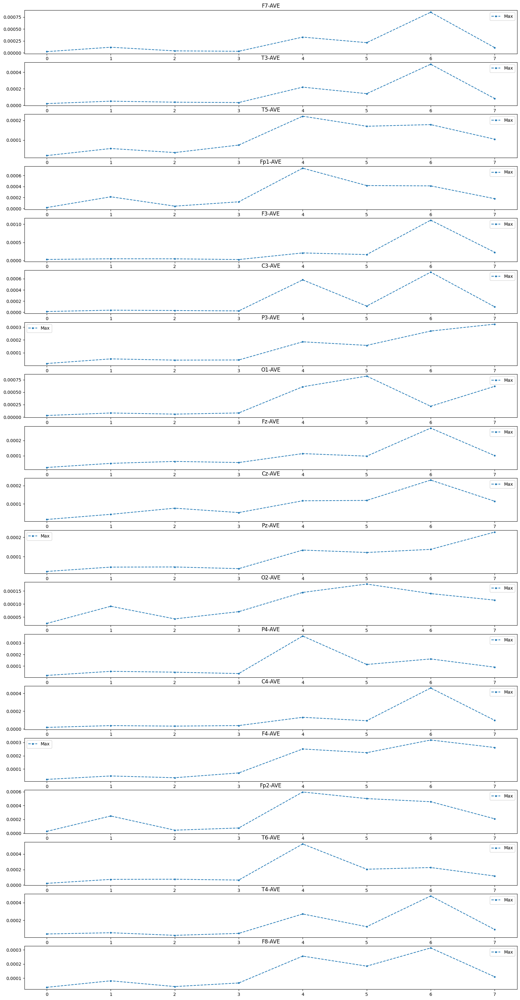

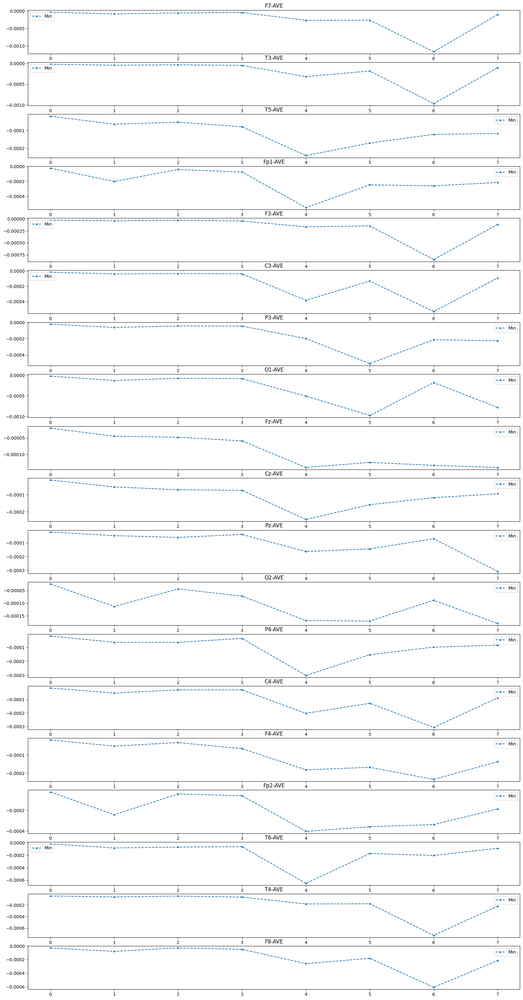

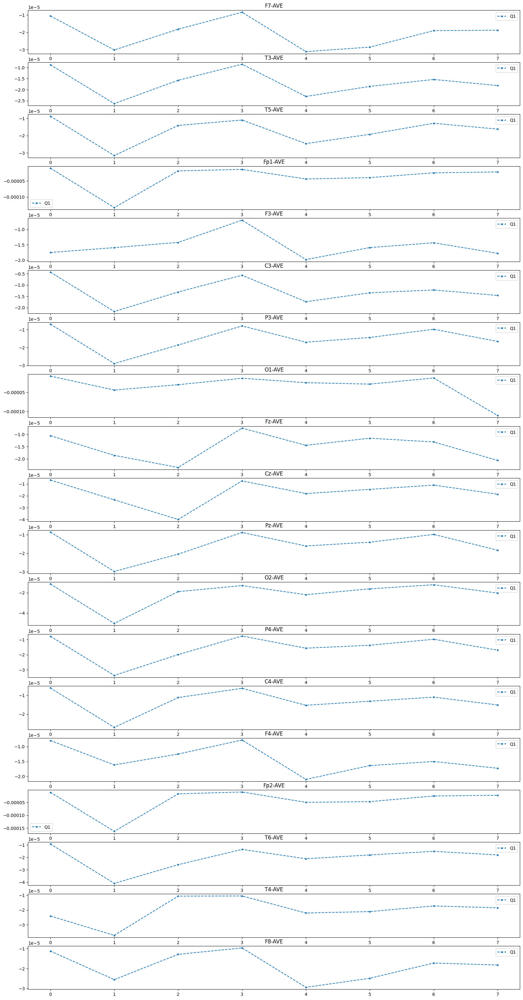

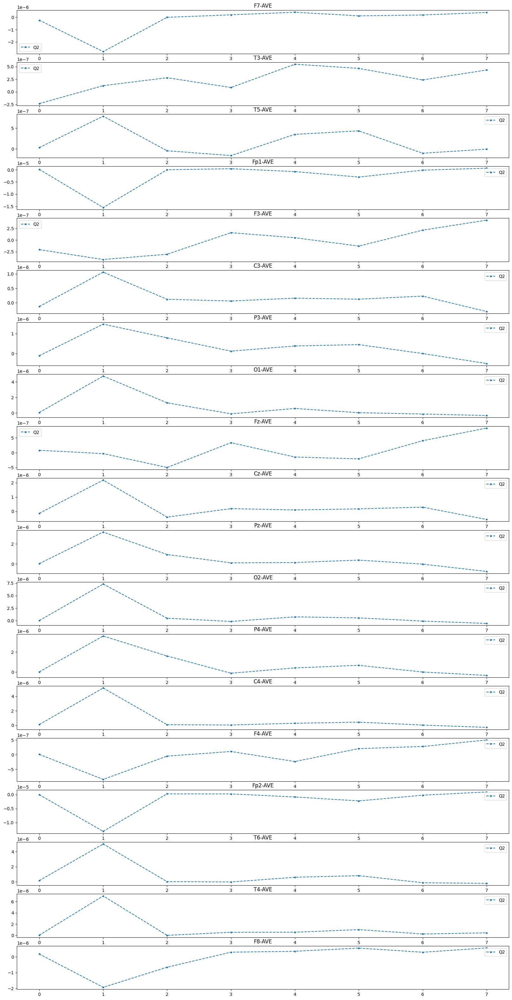

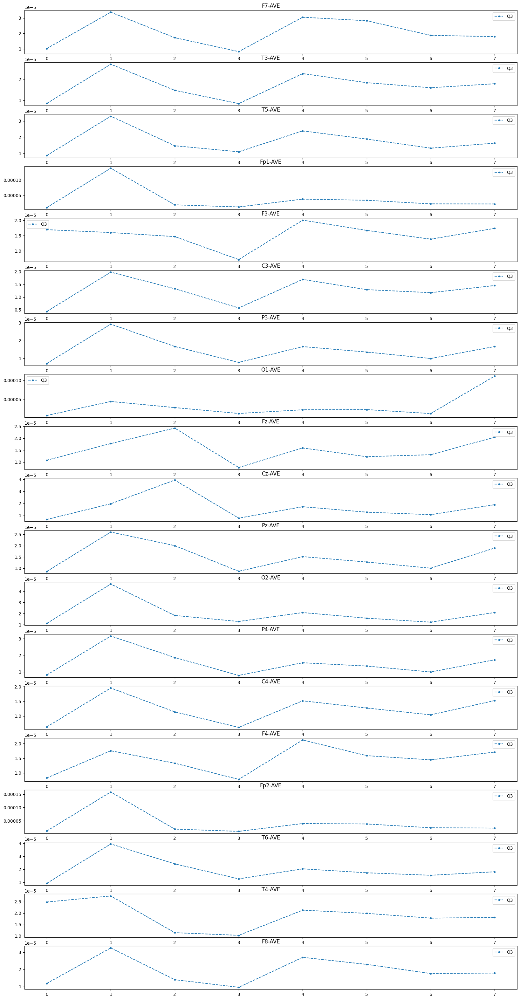

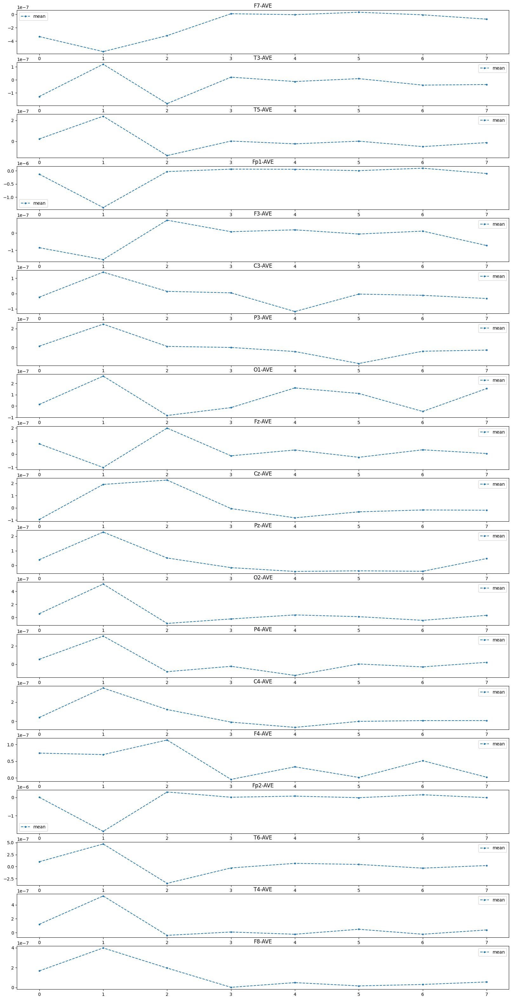

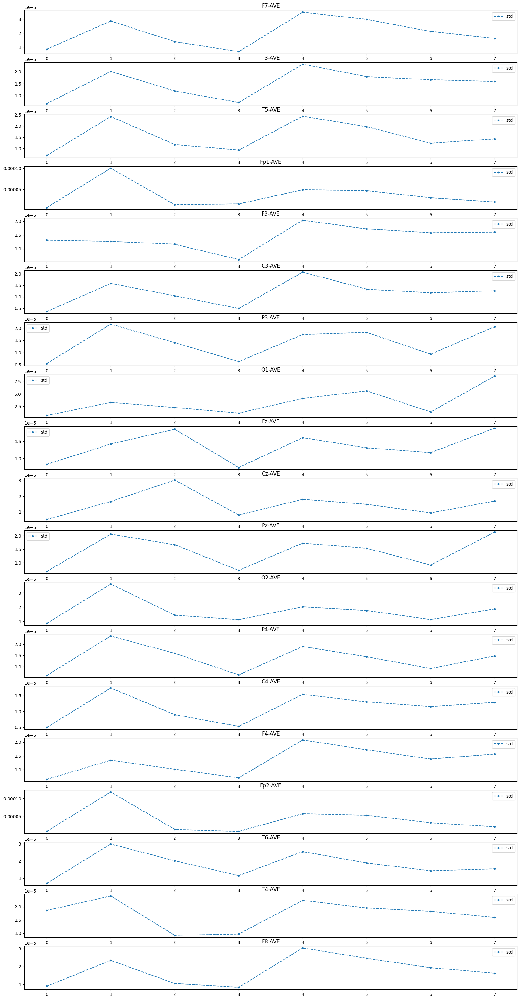

In [6]:
# Plot out the summary and save the result to VIS_FILE_DIRC folder
plot_summary(df_summary_spike, "for_all_eeg_spike")

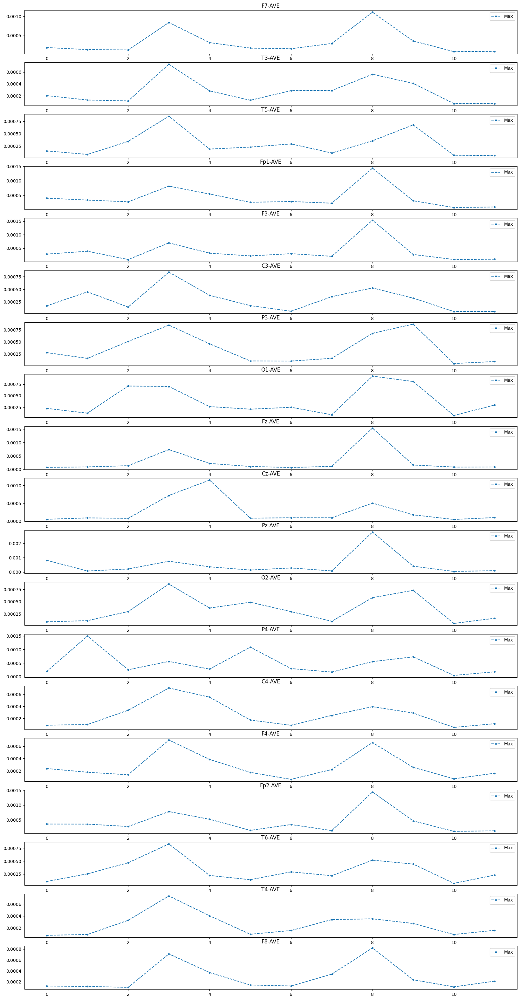

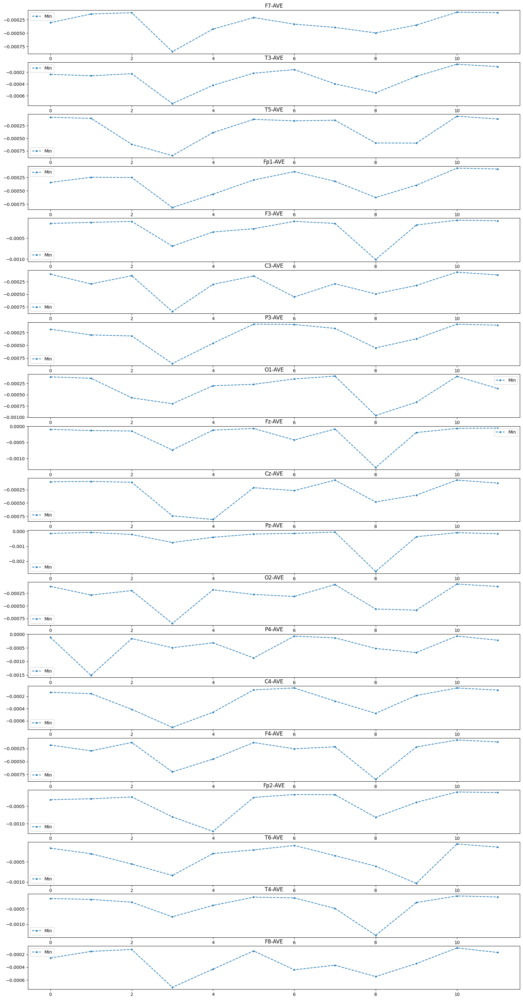

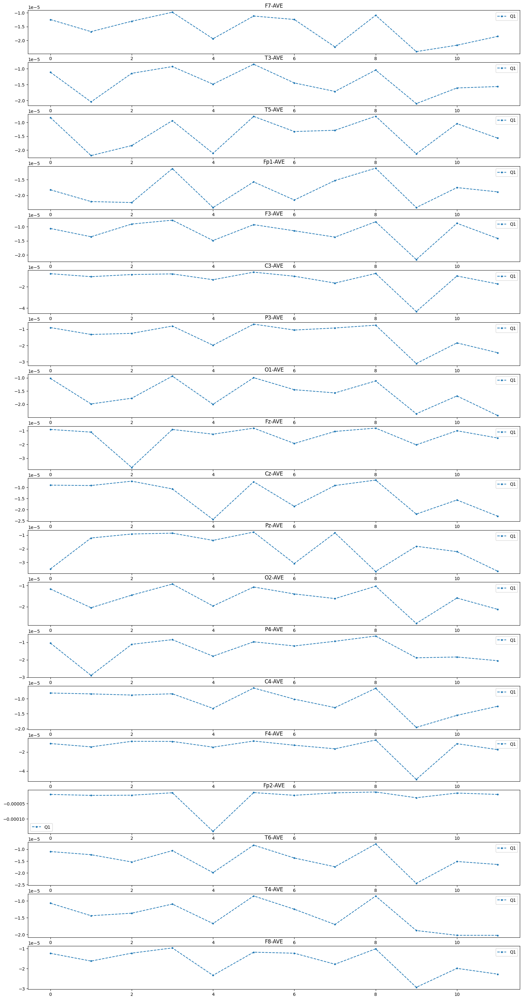

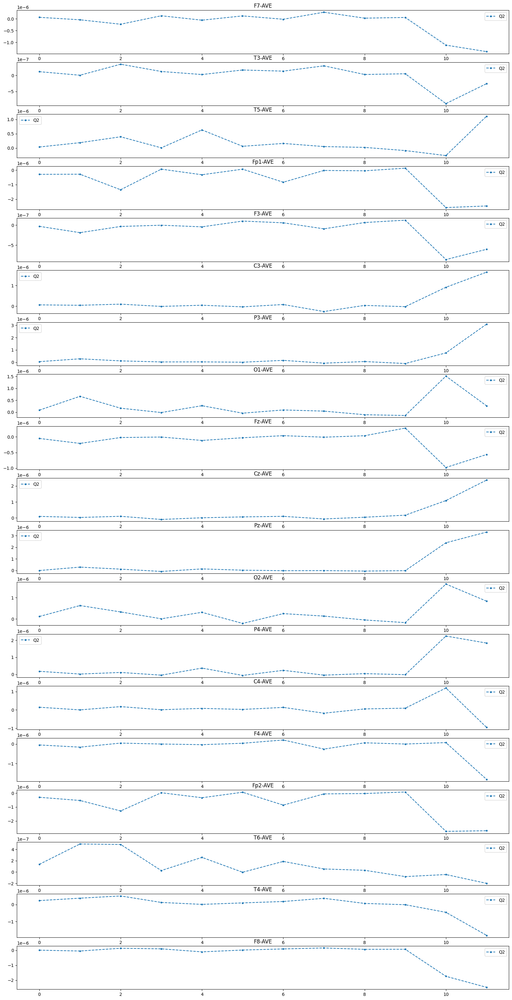

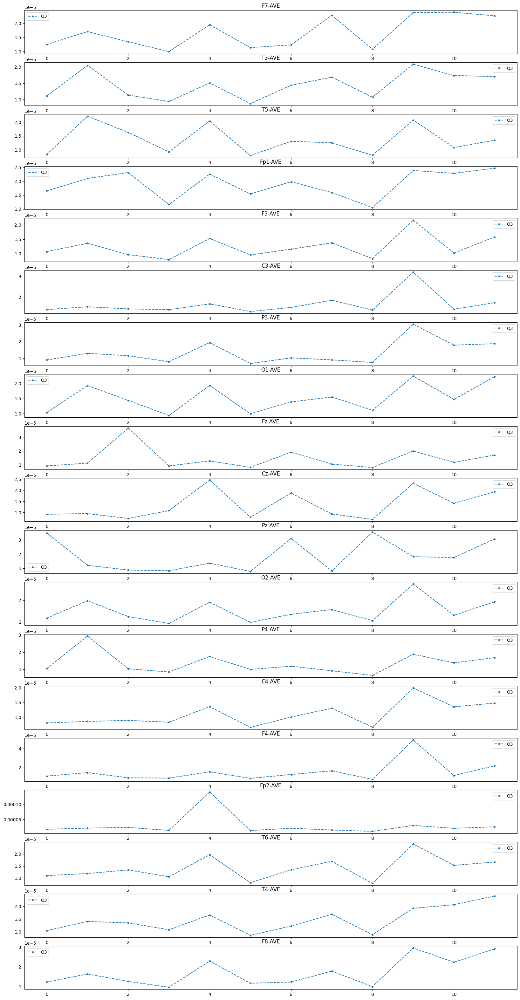

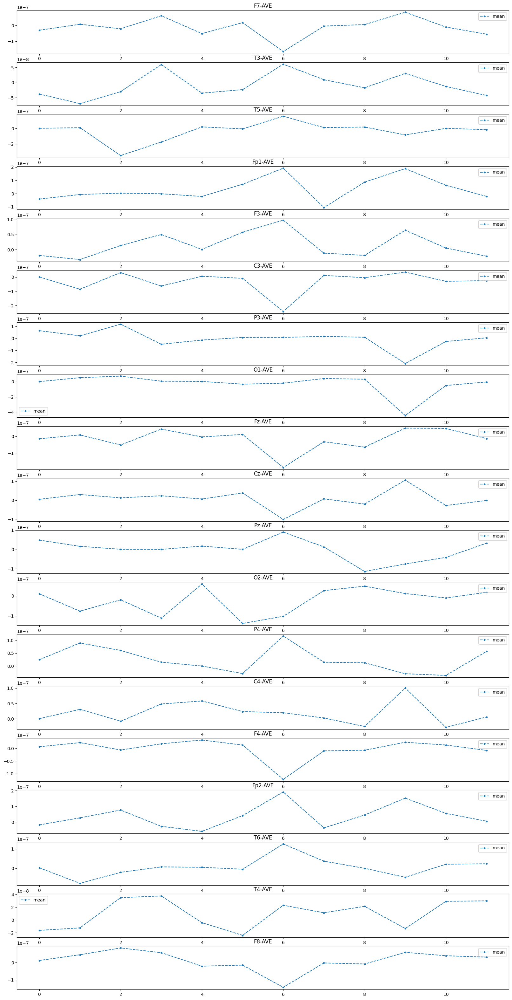

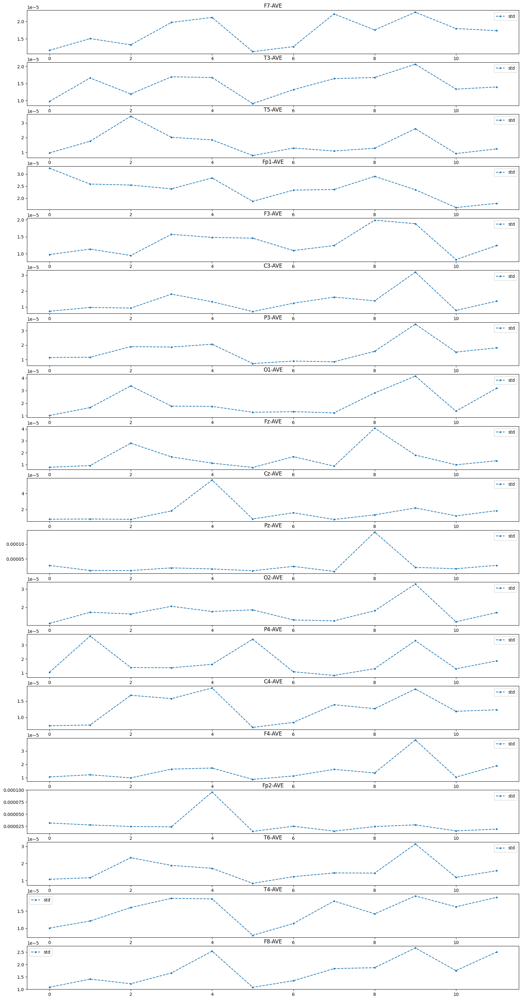

In [7]:
# Plot out the summary and save the result to VIS_FILE_DIRC folder
plot_summary(df_summary_no_spike, "for_all_eeg_no_spike")

In [8]:
# Add in overall min and overall max
df_summary_spike.loc[len(df_summary_spike)] = df_summary_spike.max(axis=0).to_numpy()
df_summary_spike.loc[len(df_summary_spike)] = df_summary_spike.min(axis=0).to_numpy()

df_summary_no_spike.loc[len(df_summary_no_spike)] = df_summary_no_spike.max(axis=0).to_numpy()
df_summary_no_spike.loc[len(df_summary_no_spike)] = df_summary_no_spike.min(axis=0).to_numpy()

In [9]:
df_summary_spike

,F7-AVE,T3-AVE,T5-AVE,Fp1-AVE,F3-AVE,C3-AVE,P3-AVE,O1-AVE,Fz-AVE,Cz-AVE,Pz-AVE,O2-AVE,P4-AVE,C4-AVE,F4-AVE,Fp2-AVE,T6-AVE,T4-AVE,F8-AVE
EEG file,,,,,,,,,,,,,,,,,,,
1 (Max),2.516241e-05,2.060627e-05,2.140262e-05,1.733020e-05,3.076861e-05,1.361411e-05,1.544825e-05,3.093323e-05,2.354132e-05,1.425629e-05,2.378162e-05,2.549716e-05,1.937244e-05,1.798888e-05,2.266629e-05,2.767536e-05,2.136779e-05,4.334857e-05,3.440422e-05
1 (Min),-3.377519e-05,-2.096433e-05,-2.015605e-05,-2.372543e-05,-2.927818e-05,-1.351181e-05,-2.098717e-05,-1.979544e-05,-2.009281e-05,-1.430310e-05,-2.177649e-05,-2.452922e-05,-1.974985e-05,-1.461749e-05,-1.736297e-05,-2.174240e-05,-2.012651e-05,-4.189495e-05,-2.812878e-05
1 (Q-90%),-1.049253e-05,-8.776981e-06,-8.778364e-06,-9.900810e-06,-1.748763e-05,-4.313385e-06,-6.896530e-06,-7.616090e-06,-1.056127e-05,-6.727169e-06,-8.545014e-06,-1.148675e-05,-7.800735e-06,-6.105223e-06,-7.983453e-06,-1.113304e-05,-9.174845e-06,-2.405576e-05,-1.121812e-05
1 (Q2),-2.339805e-07,-2.334516e-07,3.050057e-08,1.793211e-07,-2.063762e-07,-1.338426e-07,-1.096539e-07,6.776816e-08,7.922098e-08,-1.350548e-07,4.105114e-08,1.606403e-08,1.117535e-08,1.133525e-07,9.059238e-09,-4.175286e-08,1.751751e-07,4.951071e-08,1.715073e-07
1 (Q-10%),1.021064e-05,8.502902e-06,8.545461e-06,9.785966e-06,1.695135e-05,4.353168e-06,7.092320e-06,7.627638e-06,1.079932e-05,6.737357e-06,8.564537e-06,1.117813e-05,8.090626e-06,6.344301e-06,8.344346e-06,1.119112e-05,9.180269e-06,2.487919e-05,1.181205e-05
1 (Mean),-3.323984e-07,-1.276042e-07,2.348736e-08,-1.289275e-07,-8.543535e-08,-2.333699e-08,1.485126e-08,1.439618e-08,7.777506e-08,-9.440399e-08,3.905346e-08,5.661118e-08,5.482267e-08,4.017111e-08,7.424917e-08,5.195184e-09,1.023735e-07,1.218038e-07,1.673165e-07
1 (Std),8.518838e-06,6.640871e-06,6.818687e-06,7.398969e-06,1.314727e-05,3.548565e-06,5.486836e-06,6.162199e-06,8.279830e-06,5.131825e-06,6.734108e-06,8.635809e-06,6.082332e-06,4.928230e-06,6.490716e-06,8.592532e-06,6.954396e-06,1.865896e-05,9.092274e-06
8 (Max),1.167088e-04,5.000571e-05,5.720112e-05,2.129039e-04,4.882312e-05,3.798222e-05,5.163754e-05,8.167568e-05,5.049091e-05,4.252504e-05,4.610034e-05,9.120940e-05,5.461411e-05,3.805142e-05,4.831731e-05,2.497148e-04,7.261460e-05,5.745190e-05,8.054629e-05
8 (Min),-8.336791e-05,-4.466319e-05,-6.459573e-05,-2.021734e-04,-4.383079e-05,-3.772659e-05,-6.209336e-05,-1.256455e-04,-4.481215e-05,-5.457346e-05,-4.773810e-05,-1.129074e-04,-6.477629e-05,-5.207790e-05,-5.107119e-05,-2.415287e-04,-8.385356e-05,-5.819299e-05,-7.821745e-05


In [10]:
df_summary_no_spike

,F7-AVE,T3-AVE,T5-AVE,Fp1-AVE,F3-AVE,C3-AVE,P3-AVE,O1-AVE,Fz-AVE,Cz-AVE,Pz-AVE,O2-AVE,P4-AVE,C4-AVE,F4-AVE,Fp2-AVE,T6-AVE,T4-AVE,F8-AVE
EEG file,,,,,,,,,,,,,,,,,,,
2 (Max),1.870950e-04,2.017208e-04,1.526398e-04,4.044232e-04,2.802408e-04,1.730519e-04,2.742653e-04,2.249535e-04,7.543222e-05,4.953253e-05,8.170616e-04,8.594839e-05,1.893446e-04,8.793647e-05,2.376588e-04,3.574029e-04,1.046998e-04,7.564022e-05,1.239477e-04
2 (Min),-3.050647e-04,-2.350504e-04,-8.421032e-05,-3.427075e-04,-1.480572e-04,-9.911232e-05,-1.845595e-04,-1.035682e-04,-9.619475e-05,-1.007896e-04,-1.451191e-04,-1.140054e-04,-1.152671e-04,-1.346574e-04,-1.839621e-04,-3.165715e-04,-1.630382e-04,-1.684299e-04,-2.556415e-04
2 (Q-90%),-1.244884e-05,-1.108657e-05,-8.253695e-06,-1.822822e-05,-1.064998e-05,-7.728170e-06,-8.982579e-06,-1.023099e-05,-9.084437e-06,-9.037140e-06,-3.476625e-05,-1.163334e-05,-1.041613e-05,-8.073524e-06,-1.107090e-05,-1.937751e-05,-1.094986e-05,-1.068381e-05,-1.234439e-05
2 (Q2),6.634245e-08,1.157922e-07,3.816327e-08,-2.906992e-07,-3.033303e-08,6.024216e-08,5.224977e-08,8.724082e-08,-5.119244e-08,9.606777e-08,-7.933385e-09,1.146166e-07,1.836839e-07,1.470170e-07,-4.696407e-08,-3.006597e-07,1.363878e-07,2.344512e-07,9.202623e-09
2 (Q-10%),1.249982e-05,1.111153e-05,8.338576e-06,1.653810e-05,1.069251e-05,7.897042e-06,9.050622e-06,1.033727e-05,9.180117e-06,9.151325e-06,3.491881e-05,1.176472e-05,1.043292e-05,8.015855e-06,1.091403e-05,1.737429e-05,1.103862e-05,1.041023e-05,1.231028e-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20 (Q-10%),2.260883e-05,1.702320e-05,1.345190e-05,2.469830e-05,1.576634e-05,1.452700e-05,1.879506e-05,2.234020e-05,1.703925e-05,1.933097e-05,3.073527e-05,1.932879e-05,1.680324e-05,1.479024e-05,2.185145e-05,2.553557e-05,1.669515e-05,2.405184e-05,2.905446e-05
20 (Mean),-5.492353e-08,-4.261124e-08,-1.549682e-08,-2.092290e-08,-2.231198e-08,-2.479894e-08,4.378740e-09,-3.544890e-09,-1.362047e-08,-1.355669e-09,3.239697e-08,1.827812e-08,5.651527e-08,5.729424e-09,-8.157602e-09,5.903246e-09,2.350210e-08,3.009729e-08,3.094296e-08
20 (Std),1.733698e-05,1.396590e-05,1.231349e-05,1.793350e-05,1.240159e-05,1.364909e-05,1.805410e-05,3.186901e-05,1.325071e-05,1.841152e-05,2.771028e-05,1.715034e-05,1.871285e-05,1.231858e-05,1.894886e-05,1.895115e-05,1.575564e-05,1.895629e-05,2.503845e-05


### Overall range

In [11]:
def print_overall_range(df, spike_or_not:str):

    print(f"Overally, for whole eeg dataset, for the data " + '\033[1m' + spike_or_not+ '\033[0m')
    print("Maximum value",df.to_numpy().max())
    print("Minimum value",df.to_numpy().min())

    dict1 = get_list_seperately(df)
    print("\nMaximum value for quatile 90%", dict1["Q3"].max())
    print("Minimum value for quatile 10%", dict1["Q1"].min(),"\n\n")

print_overall_range(df_summary_spike, "'with spike'")
print_overall_range(df_summary_no_spike, "'without spike'")

Overally, for whole eeg dataset, for the data 'with spike'
Maximum value 0.0011120281
Minimum value -0.0011670655

Maximum value for quatile 90% 0.00015859579434618354
Minimum value for quatile 10% -0.00016295802197419107 


Overally, for whole eeg dataset, for the data 'without spike'
Maximum value 0.0027804049
Minimum value -0.0026806903

Maximum value for quatile 90% 0.00014144375745672733
Minimum value for quatile 10% -0.00014141570136416703 




In [12]:
df_summary_spike.to_csv(f"{VIS_FILE_DIRC}/Summary_spike.csv")
df_summary_no_spike.to_csv(f"{VIS_FILE_DIRC}/Summary_no_spike.csv")

### Analysis of result
* The important part of EEG data is in range (-0.0012, 0.0012)
* Overall range is in (-0.0027, 0.0028)
* Therefore, we need to normalize it by dividing **0.0012** and apply mu law so that we can focus on signal in (-0.0012, 0.0011) and at the same time magnify the data that is in quatile 10% and 90%

## Load a single processed EEG files 

In [13]:
num = 6
df = get_df(f'{CSV_FILE_DIRC}/eeg{num}.csv') # Load the eeg file after apply average montage, band pass filter and resample to 128 Hz

The data from EEG_csv/eeg6.csv is loaded 


In [14]:
df.describe()

,F7-AVE,T3-AVE,T5-AVE,Fp1-AVE,F3-AVE,C3-AVE,P3-AVE,O1-AVE,Fz-AVE,Cz-AVE,Pz-AVE,O2-AVE,P4-AVE,C4-AVE,F4-AVE,Fp2-AVE,T6-AVE,T4-AVE,F8-AVE
count,5.297920e+05,5.297920e+05,5.297920e+05,5.297920e+05,5.297920e+05,5.297920e+05,5.297920e+05,5.297920e+05,5.297920e+05,5.297920e+05,5.297920e+05,5.297920e+05,5.297920e+05,5.297920e+05,5.297920e+05,5.297920e+05,5.297920e+05,5.297920e+05,5.297920e+05
mean,-6.656481e-10,-6.582845e-10,-5.039809e-10,-6.511374e-10,-4.849919e-10,-2.509508e-10,-5.340581e-10,-3.781491e-10,1.688196e-11,6.995317e-09,-2.006025e-10,-7.401573e-10,-3.054046e-10,-5.994403e-11,-2.084300e-10,1.266237e-10,-6.787351e-10,-4.517103e-10,-3.667050e-10
std,2.157118e-05,1.703463e-05,1.861831e-05,3.320691e-05,2.153110e-05,1.419462e-05,2.185751e-05,1.772489e-05,1.178697e-05,5.605756e-05,1.480519e-05,2.406020e-05,1.753745e-05,2.057787e-05,1.742662e-05,9.648021e-05,1.869495e-05,1.881770e-05,2.578871e-05
min,-5.159572e-04,-4.947276e-04,-3.873785e-04,-1.292956e-03,-1.314581e-03,-3.961680e-04,-8.443415e-04,-3.012147e-04,-2.372781e-04,-8.086045e-04,-4.012689e-04,-1.335331e-03,-4.067222e-04,-6.140698e-04,-4.777441e-04,-1.218845e-03,-3.930511e-04,-5.002650e-04,-4.293811e-04
25%,-9.485731e-06,-7.755800e-06,-9.918590e-06,-1.037421e-05,-7.785432e-06,-7.252859e-06,-1.061919e-05,-1.009428e-05,-6.652933e-06,-8.743019e-06,-7.195829e-06,-9.753906e-06,-9.059196e-06,-7.340186e-06,-7.700680e-06,-6.506888e-05,-1.036588e-05,-9.082029e-06,-1.066050e-05
50%,-5.159510e-08,4.636498e-08,6.464258e-07,-4.254173e-07,-6.531780e-08,1.526660e-08,-5.185040e-09,3.089725e-07,-1.382092e-07,-1.569488e-08,1.373179e-07,4.027953e-07,4.323854e-07,7.562640e-08,-5.519111e-08,-4.687138e-07,2.913679e-07,6.328564e-08,-1.304921e-07
75%,9.369016e-06,7.873558e-06,1.095754e-05,9.367173e-06,7.760145e-06,7.289427e-06,1.057332e-05,1.055259e-05,6.433569e-06,8.707243e-06,7.423584e-06,1.036216e-05,9.705474e-06,7.507464e-06,7.680064e-06,6.666037e-05,1.088061e-05,9.173041e-06,1.046580e-05
max,3.825987e-04,3.547325e-04,2.482377e-04,1.284651e-03,1.305466e-03,4.721259e-04,4.976516e-04,3.124448e-04,2.678196e-04,1.152226e-03,3.636282e-04,1.343206e-03,2.776906e-04,6.520629e-04,3.850267e-04,5.191623e-04,3.537452e-04,4.025272e-04,4.169520e-04


## Visualize the effect of normalize and apply mu law

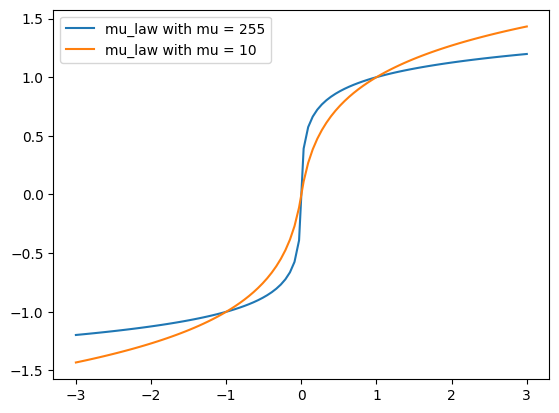

In [15]:
# Look at effect of apply mu law
arr = np.linspace(-3,3,100)
# plt.plot(arr, arr, label="Original")
plt.plot(arr, mu_law(arr), label="mu_law with mu = 255")
plt.plot(arr, mu_law(arr,10), label="mu_law with mu = 10")
plt.legend()
plt.show()

In [16]:
df_mu_law = mu_law(df/0.0012)
df_mu_law.describe()

,F7-AVE,T3-AVE,T5-AVE,Fp1-AVE,F3-AVE,C3-AVE,P3-AVE,O1-AVE,Fz-AVE,Cz-AVE,Pz-AVE,O2-AVE,P4-AVE,C4-AVE,F4-AVE,Fp2-AVE,T6-AVE,T4-AVE,F8-AVE
count,529792.000000,529792.000000,529792.000000,529792.000000,529792.000000,529792.000000,529792.000000,529792.000000,529792.000000,529792.000000,529792.000000,529792.000000,529792.000000,529792.000000,529792.000000,529792.000000,529792.000000,529792.000000,529792.000000
mean,-0.000648,0.000882,0.006101,-0.006519,-0.000341,-0.000041,-0.000686,0.002799,-0.001455,-0.000220,0.001326,0.003824,0.004239,0.001616,0.000085,-0.004008,0.003016,0.000369,-0.001814
std,0.235351,0.207634,0.236133,0.258421,0.204069,0.192531,0.235085,0.231709,0.183165,0.291906,0.194128,0.231849,0.221481,0.199667,0.206244,0.470780,0.233814,0.219434,0.253830
min,-0.848718,-0.841210,-0.797569,-1.013404,-1.016385,-0.801567,-0.936904,-0.752819,-0.710538,-0.929150,-0.803848,-1.019199,-0.806254,-0.879851,-0.834971,-1.002799,-0.800160,-0.843199,-0.815922
25%,-0.199063,-0.175620,-0.204481,-0.210013,-0.176048,-0.168191,-0.212920,-0.206634,-0.158909,-0.189369,-0.167329,-0.202439,-0.193559,-0.169503,-0.174821,-0.486271,-0.209914,-0.193858,-0.213405
50%,-0.001966,0.001768,0.023212,-0.015607,-0.002486,0.000584,-0.000199,0.011468,-0.005220,-0.000600,0.005187,0.014811,0.015852,0.002875,-0.002103,-0.017123,0.010834,0.002409,-0.004933
75%,0.197573,0.177316,0.216858,0.197550,0.175683,0.168742,0.212379,0.212134,0.155393,0.188889,0.170747,0.209869,0.201834,0.171990,0.174521,0.490338,0.215970,0.195045,0.211105
max,0.795357,0.781892,0.718526,1.012246,1.015134,0.832859,0.842263,0.759320,0.731973,0.992703,0.786301,1.020256,0.738389,0.890597,0.796484,0.849824,0.781396,0.804406,0.810683


### KDE Graph (Original)

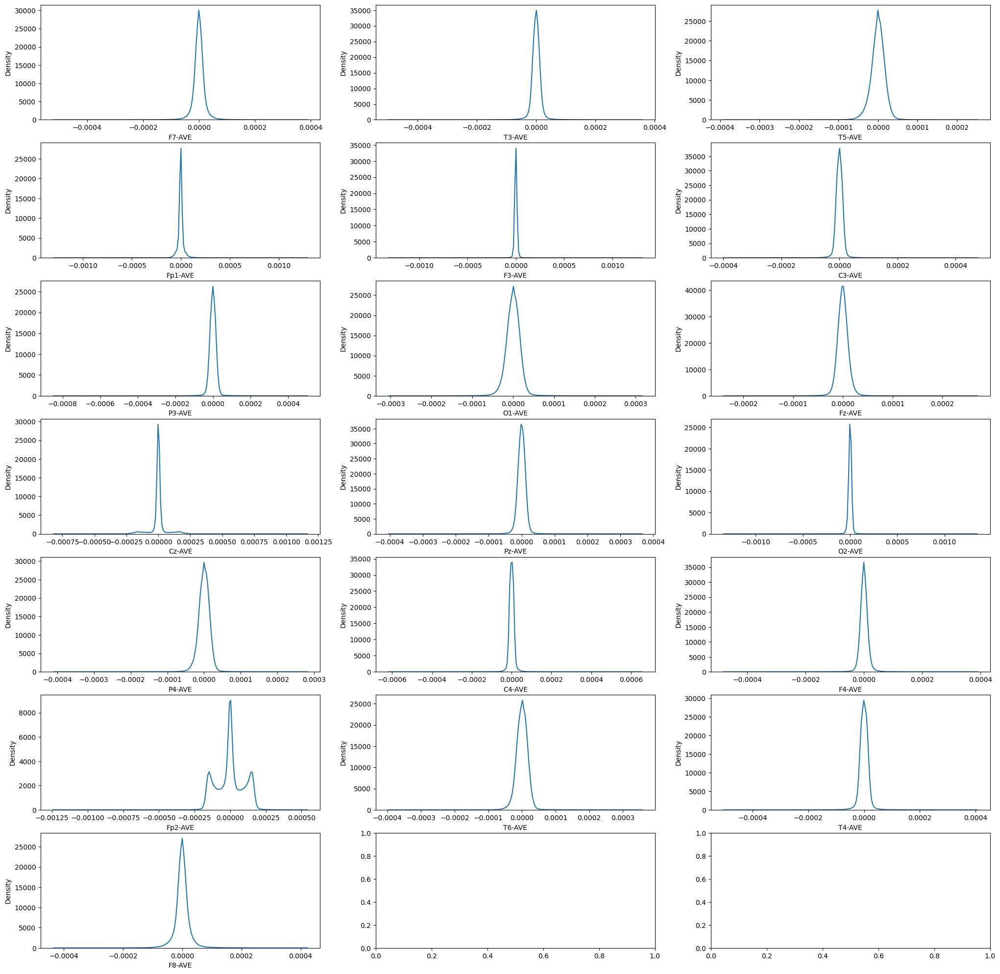

CPU times: total: 25.5 s
Wall time: 25.2 s


In [17]:
%%time
fig, ax = plt.subplots(7,3,figsize=(25,25))
for i,col in enumerate(df.columns):
    sns.kdeplot(data=df, x=col, ax=ax[i//3,i%3])
plt.show()

### KDE Graph (After normalize and apply mu_law)

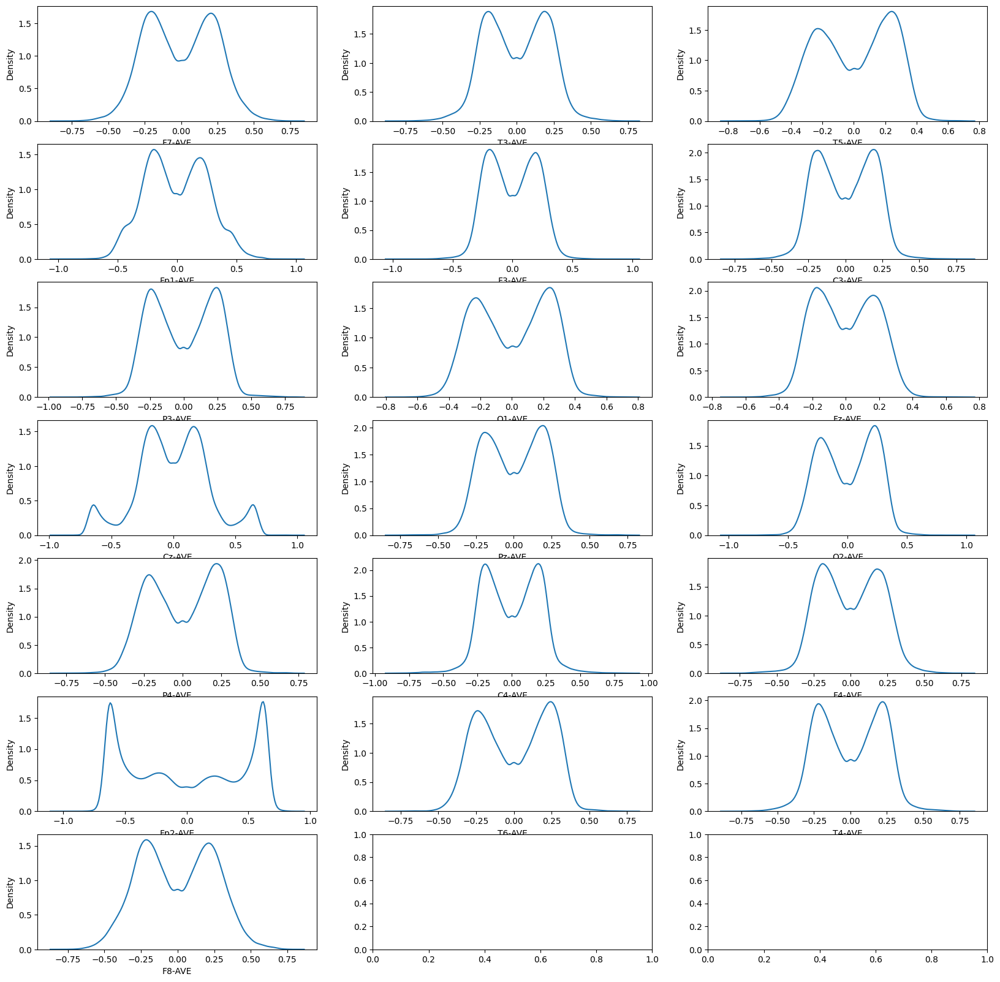

CPU times: total: 1min 9s
Wall time: 1min 9s


In [18]:
%%time
fig, ax = plt.subplots(7,3,figsize=(20,20))
for i,col in enumerate(df_mu_law.columns):
    sns.kdeplot(data=df_mu_law, x=col, ax=ax[i//3,i%3])
plt.show()

### 2D Graph (Visualize via matplotlib - Before & After)

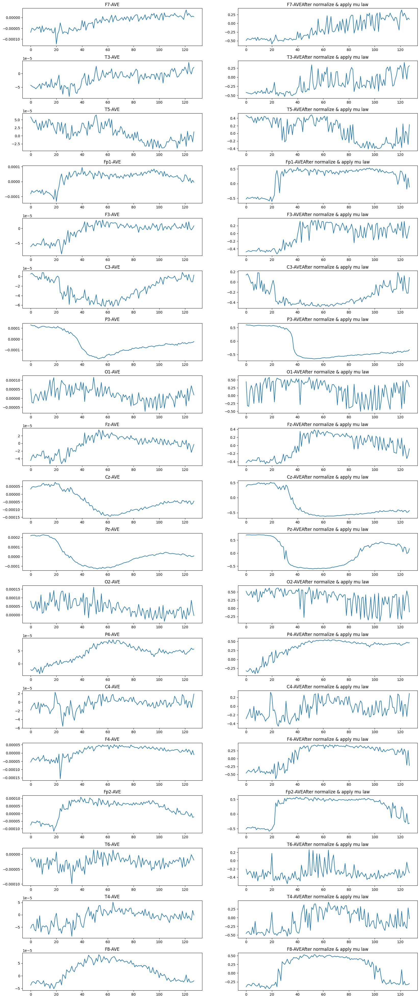

In [19]:
# This is a sample data with spike
START_INDEX = 105*NEW_FREQUENCY
END_INDEX   = 106*NEW_FREQUENCY

fig, axs = plt.subplots(len(AVE_CHANNELS_NAME), 2, figsize=(20, 50))
plt.subplots_adjust(hspace=0.4)

if type(df) != np.ndarray:
    df = df.to_numpy()
for i, col in enumerate(AVE_CHANNELS_NAME):
    axs[i][0].set_title(col)
    axs[i][0].plot(df[START_INDEX:END_INDEX,i])

if type(df_mu_law) != np.ndarray:
    df_mu_law = df_mu_law.to_numpy()
for i, col in enumerate(AVE_CHANNELS_NAME):
    axs[i][1].set_title(col + "After normalize & apply mu law")
    axs[i][1].plot(df_mu_law[START_INDEX:END_INDEX,i])
    
SAVE_PATH = f'{VIS_FILE_DIRC}/signal.png'
plt.savefig(SAVE_PATH, transparent = False,  facecolor = 'white')
plt.show()

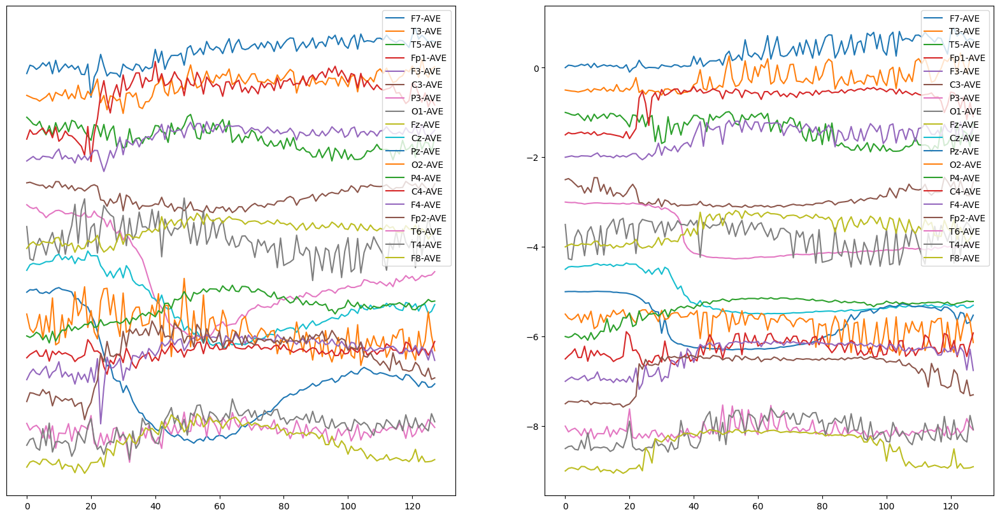

In [20]:
# START_INDEX = 269*NEW_FREQUENCY
# END_INDEX   = 271*NEW_FREQUENCY
START_INDEX = 105*NEW_FREQUENCY
END_INDEX   = 106*NEW_FREQUENCY


fig, axs = plt.subplots(1, 2, figsize=(20, 10))
plt.subplots_adjust(hspace=0.4)

if type(df) != np.ndarray:
    df = df.to_numpy()
seperate=5e-5
for i, col in enumerate(AVE_CHANNELS_NAME):
    axs[0].plot(df[START_INDEX:END_INDEX,i]-df[START_INDEX,i]-seperate*i, label=col)
    axs[0].set_yticks([])
    axs[0].legend()
    
if type(df_mu_law) != np.ndarray:
    df_mu_law = df_mu_law.to_numpy()
seperate=0.5
for i, col in enumerate(AVE_CHANNELS_NAME):
    axs[1].plot(df_mu_law[START_INDEX:END_INDEX,i]-df_mu_law[START_INDEX,i]-seperate*i, label=col)
    axs[1].legend()

SAVE_PATH = f'{VIS_FILE_DIRC}/signal.png'
plt.savefig(SAVE_PATH, transparent = False,  facecolor = 'white')
plt.show()

### 2D Graph with diffused signal

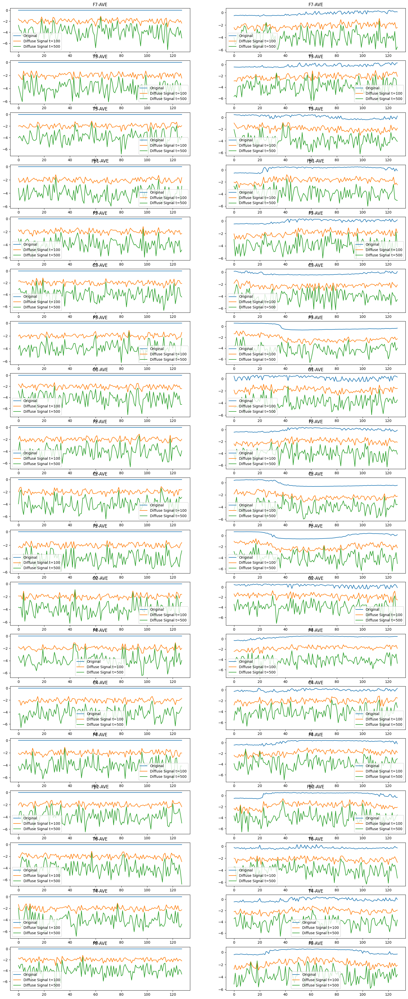

In [21]:
t_list    = [100, 500]
seperated = 2
fig, axs = plt.subplots(len(AVE_CHANNELS_NAME), 2, figsize=(20, 50))

def plot_eeg(df_used, k):
    x_0 = torch.tensor(df_used[START_INDEX:END_INDEX]) 
    eps = torch.randn_like(x_0) 
    x_t = []

    for t in t_list:
        x_t.append(q_sample(x_0, alphas_prod_p_sqrt[t-1], eps))

    for i, col in enumerate(AVE_CHANNELS_NAME):
        axs[i][k].set_title(col)
        axs[i][k].plot(x_0[:,i], label = "Original")
        for j in range(len(t_list)):
            axs[i][k].plot(x_t[j][:,i] - seperated*(j+1), label = f"Diffuse Signal t={t_list[j]}")                 
        axs[i][k].legend()

# For EEG data after apply average montage, band pass filter and resample to 128 Hz
plot_eeg(df, 0)
# plot_eeg(df/0.0012, 0) # After normalize, it also only have limited difference               
         
# For EEG data after apply average montage, band pass filter and resample to 128 Hz, normalize and apply mu law
plot_eeg(df_mu_law, 1)
                        

SAVE_PATH = f'{VIS_FILE_DIRC}\diffuseSignal.png'
plt.savefig(SAVE_PATH, transparent = False,  facecolor = 'white')
plt.show()


## Determine maximum value after normalize and apply mu law

In [22]:
# Create empty dataframe
df_summary = pd.DataFrame(columns=["EEG file"] + AVE_CHANNELS_NAME)
df_summary
def append_result_max(num, df_summary, df):
    df = mu_law(df / 0.0012)
    df_summary.loc[len(df_summary)] = np.concatenate(([str(num) + " (Max)"]  , df.max(axis=0).to_numpy() ))           # Add in the maximum value for each channel
    df_summary.loc[len(df_summary)] = np.concatenate(([str(num) + " (Min)"]  , df.min(axis=0).to_numpy() )) 
    
    return df_summary

In [23]:
%%time
for num in range(1,21):
    df = get_df(f'{CSV_FILE_DIRC}/eeg{num}.csv')
    df_summary = append_result_max(num, df_summary, df) 

The data from EEG_csv/eeg1.csv is loaded 
The data from EEG_csv/eeg2.csv is loaded 
The data from EEG_csv/eeg3.csv is loaded 
The data from EEG_csv/eeg4.csv is loaded 
The data from EEG_csv/eeg5.csv is loaded 
The data from EEG_csv/eeg6.csv is loaded 
The data from EEG_csv/eeg7.csv is loaded 
The data from EEG_csv/eeg8.csv is loaded 
The data from EEG_csv/eeg9.csv is loaded 
The data from EEG_csv/eeg10.csv is loaded 
The data from EEG_csv/eeg11.csv is loaded 
The data from EEG_csv/eeg12.csv is loaded 
The data from EEG_csv/eeg13.csv is loaded 
The data from EEG_csv/eeg14.csv is loaded 
The data from EEG_csv/eeg15.csv is loaded 
The data from EEG_csv/eeg16.csv is loaded 
The data from EEG_csv/eeg17.csv is loaded 
The data from EEG_csv/eeg18.csv is loaded 
The data from EEG_csv/eeg19.csv is loaded 
The data from EEG_csv/eeg20.csv is loaded 
CPU times: total: 1min 56s
Wall time: 1min 58s


In [24]:
df_summary = df_summary.set_index('EEG file')
df_summary = df_summary.astype(np.float32)

In [25]:
print("For each channel:\n", pd.concat([df_summary.max(axis=0), df_summary.min(axis=0)], axis=1))
print("Maximum value overally:", df_summary.max().max())
print("Minimum value overally:", df_summary.min().min())

For each channel:
                 0         1
F7-AVE   1.088979 -1.107828
T3-AVE   1.085282 -1.107389
T5-AVE   1.115488 -1.084348
Fp1-AVE  1.033698 -1.052543
F3-AVE   1.099146 -1.083321
C3-AVE   1.104519 -1.065241
P3-AVE   1.091064 -1.112893
O1-AVE   1.122129 -1.152289
Fz-AVE   1.044820 -1.037138
Cz-AVE   1.017643 -1.027949
Pz-AVE   1.151132 -1.153676
O2-AVE   1.165920 -1.137633
P4-AVE   1.127180 -1.115384
C4-AVE   1.129704 -1.117948
F4-AVE   1.147980 -1.111344
Fp2-AVE  1.036745 -1.049274
T6-AVE   1.129631 -1.126507
T4-AVE   1.124484 -1.139938
F8-AVE   1.147484 -1.147984
Maximum value overally: 1.1659205
Minimum value overally: -1.1536762


* From here, the value use to normalize the EEG data to range between [-1, 1] will be 1.17